In [1]:
# EDA_Lesion_Images.ipynb

import os
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np
import pandas as pd
from collections import defaultdict
import random


In [7]:

# Path to your data
base_path = "../data/processed"

# Setup
splits = ['train', 'val', 'test']
class_counts = defaultdict(lambda: defaultdict(int))
image_shapes = []

In [8]:
# 1. Class Distribution
for split in splits:
    split_path = os.path.join(base_path, split)
    if not os.path.exists(split_path):
        continue

    for class_name in os.listdir(split_path):
        class_path = os.path.join(split_path, class_name)
        if os.path.isdir(class_path):
            image_files = os.listdir(class_path)
            class_counts[split][class_name] = len(image_files)

            # Optional: collect image shapes
            for image_file in random.sample(image_files, min(5, len(image_files))):  # just a few per class
                try:
                    img = Image.open(os.path.join(class_path, image_file))
                    image_shapes.append(img.size)
                except:
                    print(f"⚠️ Corrupt image: {image_file}")

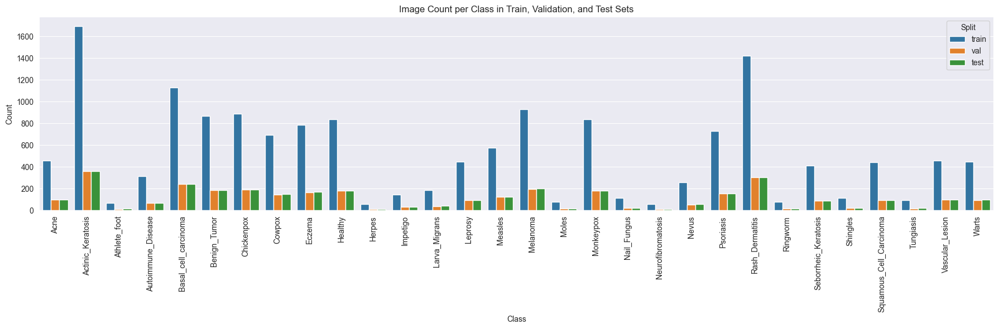

In [9]:
# Convert counts to DataFrame for plotting
df_data = []
for split, counts in class_counts.items():
    for class_name, count in counts.items():
        df_data.append({'Split': split, 'Class': class_name, 'Count': count})
df_counts = pd.DataFrame(df_data)

# 2. Plot class distribution
plt.figure(figsize=(18, 6))
sns.barplot(data=df_counts, x='Class', y='Count', hue='Split')
plt.title("Image Count per Class in Train, Validation, and Test Sets")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [10]:
# 3. Image shape statistics
if image_shapes:
    widths, heights = zip(*image_shapes)
    print(f"📏 Sample Image Sizes:")
    print(f" - Mean size: ({np.mean(widths):.1f}, {np.mean(heights):.1f})")
    print(f" - Min size: ({np.min(widths)}, {np.min(heights)})")
    print(f" - Max size: ({np.max(widths)}, {np.max(heights)})")

📏 Sample Image Sizes:
 - Mean size: (224.0, 224.0)
 - Min size: (224, 224)
 - Max size: (224, 224)


In [12]:
# 4. Show sample images
def plot_sample_images(split='train', n_per_class=3):
    split_path = os.path.join(base_path, split)
    class_dirs = sorted(os.listdir(split_path))

    for class_name in class_dirs:
        class_path = os.path.join(split_path, class_name)
        image_files = os.listdir(class_path)
        sample_files = random.sample(image_files, min(n_per_class, len(image_files)))

        fig, axs = plt.subplots(1, len(sample_files), figsize=(15, 5))
        fig.suptitle(f"{split.capitalize()} - {class_name} Samples", fontsize=14)

        for i, img_file in enumerate(sample_files):
            img = Image.open(os.path.join(class_path, img_file))
            axs[i].imshow(img)
            axs[i].axis('off')
            axs[i].set_title(img_file[:10])
        plt.show()

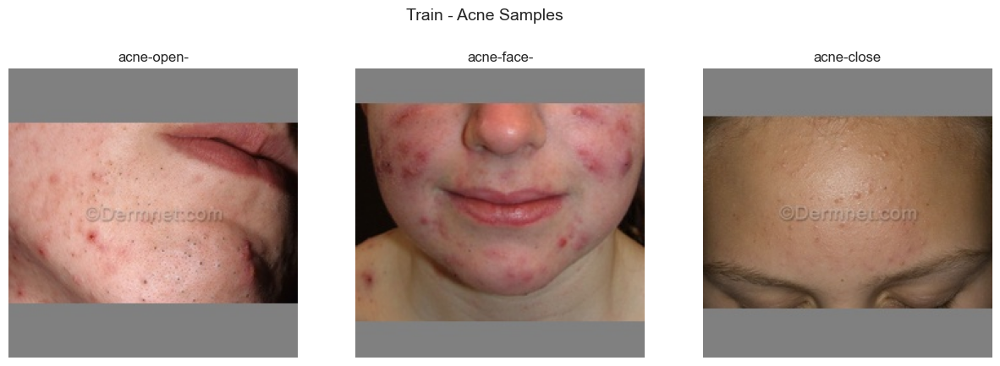

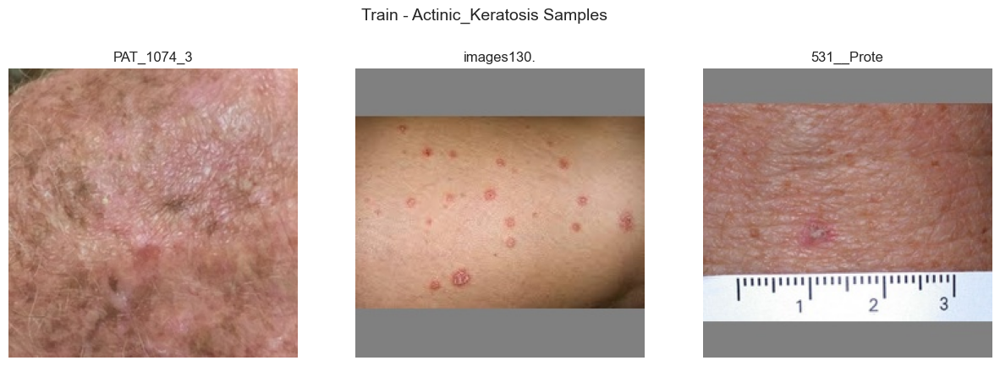

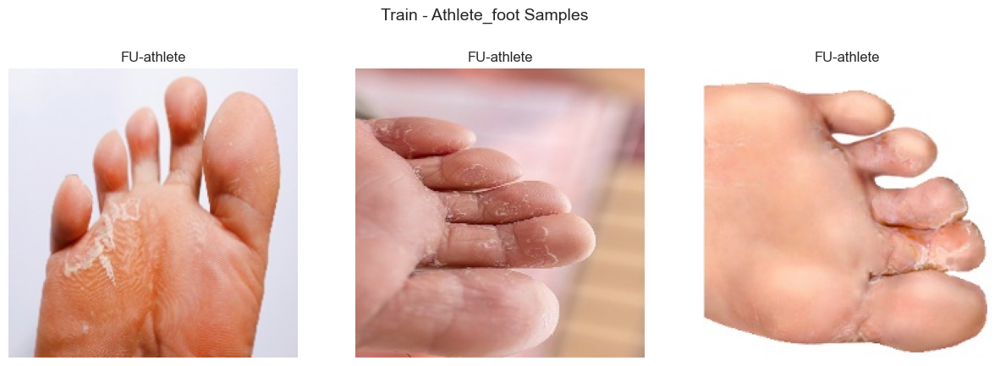

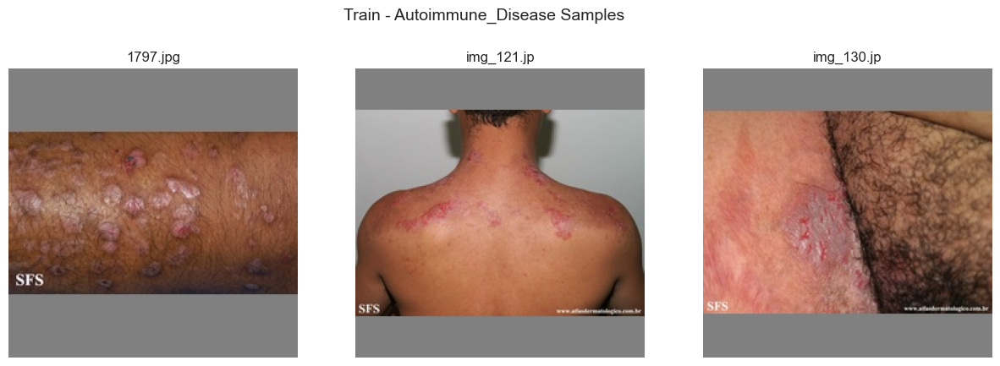

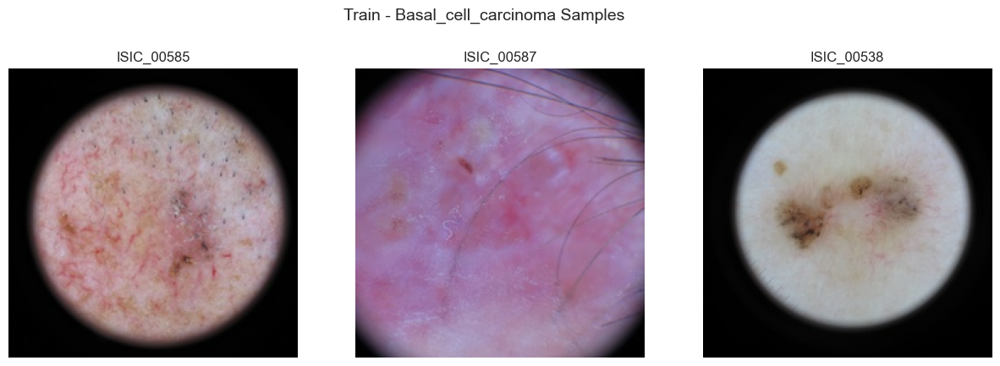

...

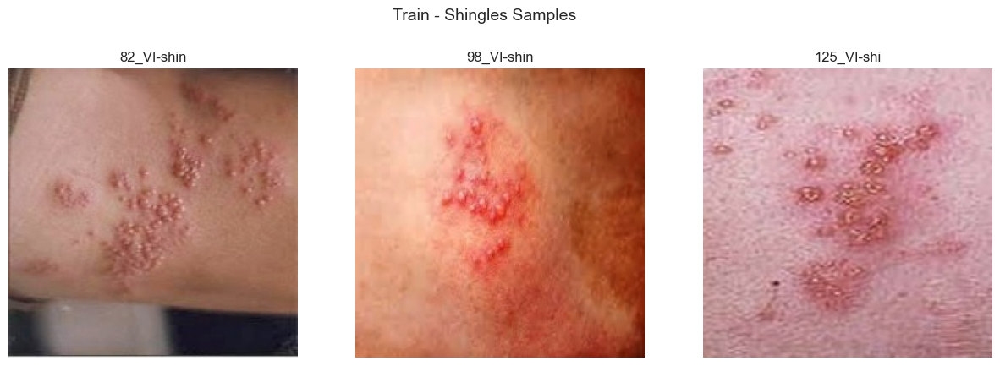

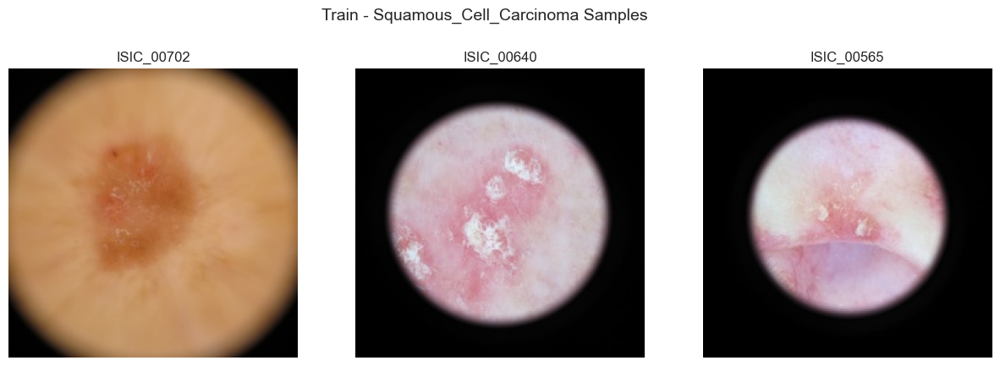

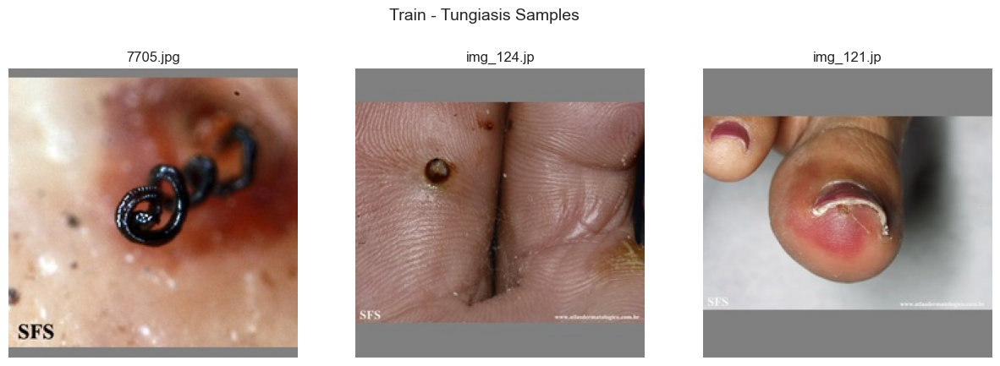

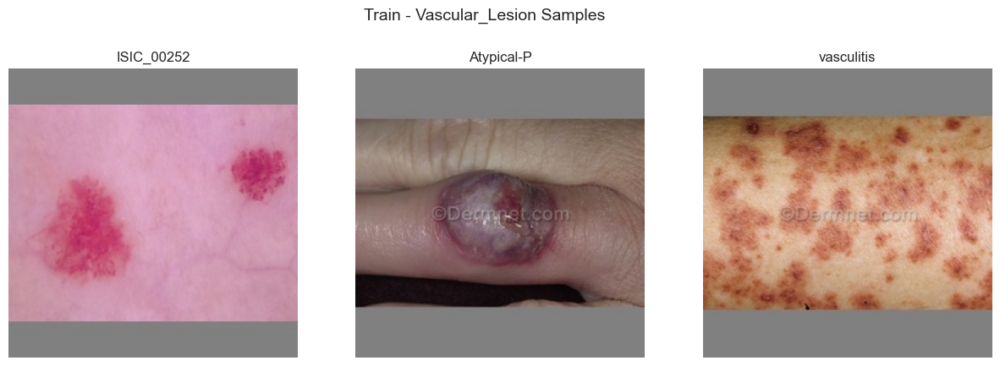

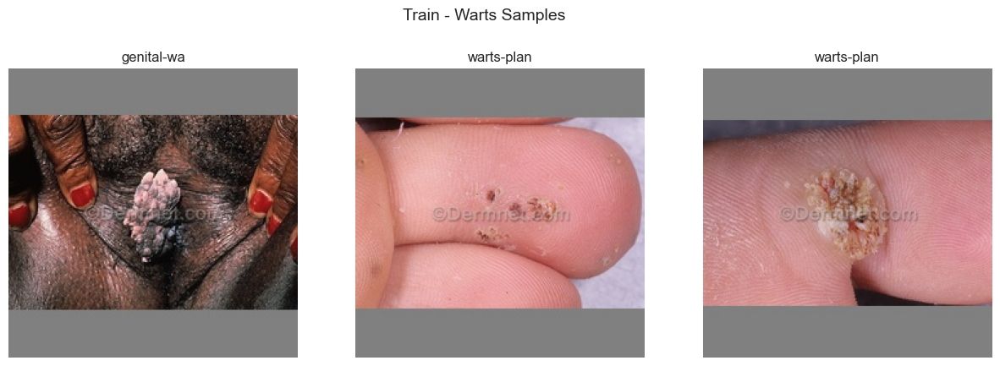

In [13]:
# Plot samples from each class
plot_sample_images('train')